## CSCI S-89 Introduction to Deep Learning
Harvard Summer School 2025

Student Name: Kyriaki Avgerinou

# Final Project:
# *Face Recognition with Deep Learning*

The goal of this project is to detect human faces in images and recognize who the faces belong to from a predefined group of people.

# Part I: **Collect Input Data**

For this project we will use Kaggle's Face Recognition Dataset (https://www.kaggle.com/datasets/vasukipatel/face-recognition-dataset/data). We will use this data to train and validate our model.

To personalize the project and make it more engaging, we will also add a few pictures of myself, my friends, and family to the input dataset. These pictures will not be included in the final submission of the project on Canvas, but they will be used to enhance the training, testing, and validation of the model. I will take new pictures for this purpose using my webcam. I will also use some older pictures I have. To access the webcam and take the pictures, I will run the following code on my local machine, not Google Colab. I will be collecting 80 pictures for each person.

In [ ]:
import cv2
import os

# Collect face images using the webcam.
# I run this locally on my laptop.
# Not on Google Colab.

# Set the label for the face (the name of the person).
# We will use this to name the folder where we will save the pictures
# and name the pictures themselves.
face_label = 'Kyriaki'
folder_name = face_label # We will store the images in this folder.
os.mkdir(folder_name) # Make folder if it doesn't exist.

counter = 0 # This will help us name the pictures Kyriaki_0.jpg, Kyriaki_1.jpg, ...

# Start webcam.
webcam = cv2.VideoCapture(0)

# While webcam is open...
while webcam.isOpened():
  # ... take a frame.
  _, frame = webcam.read()

  # Make the frame 224x224.
  # We will need this size for our model.
  frame = frame[120:120+224, 200:200+224]

  # Show the frame on the screen.
  cv2.imshow('Webcam', frame)

  # When pressing 'k', save the current frame.
  if cv2.waitKey(1) & 0XFF == ord('k'):
    imgname = os.path.join(folder_name, f'{face_label}_{counter}.jpg')
    counter += 1
    cv2.imwrite(imgname, frame)

  # When pressing 'q', break out of the loop.
  if cv2.waitKey(1) & 0XFF == ord('q'):
    break

# Close webcam.
webcam.release()

# Close all OpenCV windows.
cv2.destroyAllWindows()

# Part II: **Inspect, Clean, and Preprocess Input Data**

Let's take a look at Kaggle's Face Recognition Dataset and see whether we need to do any preprocessing or cleaning of the data.

In [ ]:
from google.colab import drive

# Mount Google Drive.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Get the path of the working directory.
project_path = '/content/drive/MyDrive/CSCI S-89 Deep Learning/FinalProject'

In [ ]:
import zipfile

RUN_ONLY_ONCE = False

if RUN_ONLY_ONCE:
  # I uploaded the input dataset to Google Drive as a zip file,
  # so first I need to unzip it.
  zip_path = os.path.join(project_path, 'face_recognition_dataset.zip')
  extract_path = os.path.join(project_path, 'face_recognition_dataset')

  with zipfile.ZipFile(zip_path, 'r') as zip_ref:
      zip_ref.extractall(extract_path)

In [ ]:
import os

# Get the path to the images.
images_path = os.path.join(project_path, 'face_recognition_dataset', 'peoples_faces', 'peoples_faces')

In [ ]:
# Get all the people in the dataset.
# Each person has their own folder with their face images.
people = os.listdir(images_path)

# Count the number of images for each person.
person_img_count = {}

for person in people:
  person_folder = os.path.join(images_path, person)
  person_img_count[person] = len(os.listdir(person_folder))

In [ ]:
print(f'In the dataset we have {len(people)} people.')

In the dataset we have 31 people.


In [ ]:
for person in person_img_count:
  print(f'{person} has {person_img_count[person]} images.')

Akshay Kumar has 50 images.
Alexandra Daddario has 92 images.
Alia Bhatt has 79 images.
Amitabh Bachchan has 74 images.
Andy Samberg has 92 images.
Anushka Sharma has 68 images.
Billie Eilish has 98 images.
Brad Pitt has 120 images.
Camila Cabello has 87 images.
Charlize Theron has 78 images.
Claire Holt has 96 images.
Courtney Cox has 80 images.
Dwayne Johnson has 61 images.
Elizabeth Olsen has 71 images.
Ellen Degeneres has 75 images.
Henry Cavill has 106 images.
Hrithik Roshan has 101 images.
Hugh Jackman has 112 images.
Jessica Alba has 108 images.
Kashyap has 30 images.
Lisa Kudrow has 70 images.
Margot Robbie has 72 images.
Marmik has 32 images.
Natalie Portman has 105 images.
Priyanka Chopra has 102 images.
Robert Downey Jr has 113 images.
Roger Federer has 77 images.
Tom Cruise has 58 images.
Vijay Deverakonda has 115 images.
Virat Kohli has 49 images.
Zac Efron has 91 images.


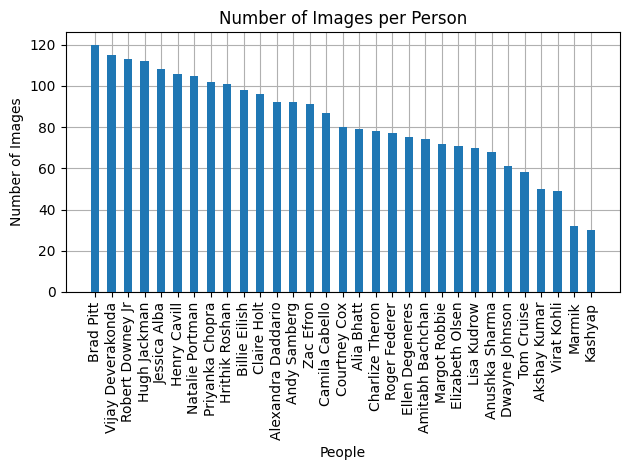

In [ ]:
import matplotlib.pyplot as plt

# Plot a bar chart to visualize how many images we have per person.

# Sort person_img_count dictionary by number of images (descending order).
sorted_person_img_count = dict(sorted(person_img_count.items(), key=lambda item: item[1], reverse=True))

plt.bar(sorted_person_img_count.keys(), sorted_person_img_count.values(), width=0.5, zorder=3)
plt.title('Number of Images per Person')
plt.xticks(rotation=90)
plt.xlabel('People')
plt.ylabel('Number of Images')
plt.grid(True, zorder=0)
plt.tight_layout()
plt.show()

In the graph above we see how many face images we have for every person in the Kaggle dataset.

As we can see, the Face Recognition Dataset has 31 people with 30-120 face images each. To have a **balanced** and **fair** input dataset, we want to use the **same number of pictures for every person**. To do this, we will keep only those who have at least 80 pictures, and for those who have more, we will delete the extras.

In [ ]:
import shutil

number_of_images = 80 # Number of images we want for every person.

# For every person in the dataset...
for person, count in person_img_count.items():
  # Take the person's folder.
  persons_folder = os.path.join(images_path, person)

  # If the person has less than 80 images,
  # delete the folder.
  if count < number_of_images:
    shutil.rmtree(persons_folder)
  # If the person has more than 80 images,
  # trim the extra images.
  else:
    # Take all images for person.
    images = sorted(os.listdir(persons_folder))

    # Get the extra images.
    extra_images = images[number_of_images:]

    # Delete extra images.
    for img in extra_images:
      os.remove(os.path.join(persons_folder, img))

Another thing worth mentioning is that not all images in the dataset have the same size. This is both for Kaggle and the images that I collected. In addition, not all images are explicitly face images. In some we see a broader view of the background or the body of the person (noise). Or there is variability in the position where the face appears in the image. To give our model a **cleaner**, **more consistent input**, we should **standardize the image content**. We will detect and crop the faces from all images and resize them to 224x224 pixels. This ensures all images are **aligned** and **uniform**, which improves the quality of the data and help the model **learn and generalize better**.

For face detection we will use **MTCNN** (Multi-task Cascaded Convolutional Neural Network), a pre-trained, deep learning model that detects faces with high accuracy. For the face detection I also tried OpenCV and Haar Cascade Classifier, but it didn't work well.

In [ ]:
!pip install mtcnn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 69.1 MB/s eta 0:00:00


In [ ]:
from mtcnn import MTCNN
import numpy as np
from PIL import Image
import cv2

RUN_ONLY_ONCE = False

if RUN_ONLY_ONCE:
  # Load MTCNN face detector.
  face_detector = MTCNN()

  # Define the target image size.
  target_image_size = (224, 224)

  # For every person in the dataset...
  for person in os.listdir(images_path):
    # Take the person's folder.
    persons_folder = os.path.join(images_path, person)

    # For every image in the person's folder...
    for img in os.listdir(persons_folder):
      try:
        # Take the image.
        image_path = os.path.join(persons_folder, img)

        # Prepare image for MTCNN.
        image = Image.open(image_path).convert('RGB')
        image_np = np.array(image)

        # Detect face.
        face = face_detector.detect_faces(image_np)

        # Take the face.
        x, y, w, h = face[0]['box']
        x, y = max(0, x), max(0, y)
        face = image_np[y:y+h, x:x+w]

        # Resize the face.
        face_resized = cv2.resize(face, target_image_size)

        # Save the new image.
        cv2.imwrite(image_path, cv2.cvtColor(face_resized, cv2.COLOR_RGB2BGR))
      except Exception as e:
        continue

This part required a lot of manual work as well. There were result images that contained the wrong face (a face from the background of the initial image for example), or something went wrong and the result image was a blur. So, I had to manually check the result images, replace the problematic initial images with new ones, and rerun the code.

# Part III: **Prepare and Preprocess Input Data for the Model**

Next, we will turn the input face images into the format that the model expects to start training.

We will create 2 new folders, one for training and one for validation, and we will split our input data into them.<br>
We will use 80% of the data for training and 20% for validation.

In [ ]:
import os

# Get the original path to the images.
original_dataset = os.path.join(project_path, 'face_recognition_dataset', 'peoples_faces', 'peoples_faces')

# Path where we will put the training and the validation folders.
target_folder = os.path.join(project_path, 'face_recognition_dataset', 'peoples_faces')

# Create the training folder.
train_dir = os.path.join(target_folder, 'train')
os.mkdir(train_dir)

# Create the validation folder.
val_dir = os.path.join(target_folder, 'validation')
os.mkdir(val_dir)

In [ ]:
import random
import shutil

# For every person in the original dataset...
for person in os.listdir(original_dataset):
  # Take the person's folder.
  persons_folder = os.path.join(original_dataset, person)

  # Shuffle the images in the folder
  # to make everything fairer.
  images = os.listdir(persons_folder)
  random.shuffle(images)

  # Split the images into training and validation subsets.
  split_point = int(len(images) * 0.8)
  train_images = images[:split_point]
  validation_images = images[split_point:]

  # Create new folders for the person
  # in the training and the validation folders.
  train_person_dir = os.path.join(train_dir, person)
  os.mkdir(train_person_dir)

  val_person_dir = os.path.join(val_dir, person)
  os.mkdir(val_person_dir)

  # Copy training images to train folder.
  for img in train_images:
    current_image_path = os.path.join(persons_folder, img)
    target_path = os.path.join(train_person_dir, img)
    shutil.copy(current_image_path, target_path)

  # Copy validation images to validation folder.
  for img in validation_images:
    current_image_path = os.path.join(persons_folder, img)
    target_path = os.path.join(val_person_dir, img)
    shutil.copy(current_image_path, target_path)

For the following preprocessing steps I used the online tensorflow documentation (https://www.tensorflow.org/tutorials/images/classification).

We will format the input data accordingly for the model:
1.   We will define that every person in the dataset is a class.
2.   We will give labels to the images (the name of the person, a.k.a. the name of the folder).
3.   We will load the images in batches (32).
4.   We will make sure all images are 224x224 pixels.

In [ ]:
import os

target_folder = os.path.join(project_path, 'face_recognition_dataset', 'peoples_faces')
train_dir = os.path.join(target_folder, 'train')
val_dir = os.path.join(target_folder, 'validation')

In [ ]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Format images for training.
train_ds = image_dataset_from_directory(
    train_dir,
    image_size=(224, 224),
    batch_size=32,
    label_mode='categorical', # one-hot encoded labels for Categorical Crossentropy
    shuffle=True
)

# Format images for validation.
val_ds = image_dataset_from_directory(
    val_dir,
    image_size=(224, 224),
    batch_size=32,
    label_mode='categorical',
    shuffle=True
)

Found 1280 files belonging to 20 classes.
Found 320 files belonging to 20 classes.


In [ ]:
for images, labels in train_ds:
  print('Train Dataset:')
  print(f'  Image Shape: {images.shape}')
  print(f'  Label Shape: {labels.shape}')
  print()
  break

for images, labels in val_ds:
  print('Validation Dataset:')
  print(f'  Image Shape: {images.shape}')
  print(f'  Label Shape: {labels.shape}')
  break

Train Dataset:
  Image Shape: (32, 224, 224, 3)
  Label Shape: (32, 20)

Validation Dataset:
  Image Shape: (32, 224, 224, 3)
  Label Shape: (32, 20)


And of course we will **scale the data**.

In [ ]:
from tensorflow.keras import layers

normalization_layer = layers.Rescaling(1./255)

# Perform pixel normalization.
train_ds_scaled = train_ds.map(lambda x, y: (normalization_layer(x), y))

val_ds_scaled = val_ds.map(lambda x, y: (normalization_layer(x), y))

And we do **data augmentation** to prevent overfitting and improve generalization (only to the training data).

In [ ]:
from tensorflow.keras import layers, Sequential

data_augmentation = Sequential([
    layers.RandomRotation(0.1),
    layers.RandomTranslation(0.2, 0.2),
    layers.RandomZoom(0.2),
    layers.RandomFlip('horizontal'),
    layers.RandomContrast(0.2),
])

train_ds_scaled_aug = train_ds_scaled.map(lambda x, y: (data_augmentation(x), y))

And now we are ready to build, compile, and train our face recognition model.

# Part IV: **Build, Train, and Evaluate Face Recognition Model**

## A. **Build a Convolutional Newral Network from scratch**

We will solve this problem as a **multi-class image classification problem**. Τhus, some choices for the model architecture and training setup are pretty clear and standard:<br>
*   We will build a **Convolutional Newral Network**.
*   Our output layer will be Dense and have 20 neurons, for the **20 classes/people** in our dataset.
*   We will use **softmax** for activation function in the output layer.
*   We will use **Categorical Crossentropy** for loss function.
*   We will use **Adam** optimizer.

Now, building on top of that, I'm thinking I shouldn't use more than **5 convolutional layers** to prevent overfitting, since our dataset is relatively small (20 classes/people * 80 images each = 1600 total images for both training and validation).<br>
I will use **MaxPooling** after every convolutional layer, and I will use **BatchNormalization**, **Dropout** layers, and **L2** for regularization.<br>
I will **gradually increase the number of filters** across the convolutional layers, and slightly reduce it in the final layer, to ease transition into the dense layers.<br>
I will use **GlobalAveragePooling2D()** instead of Flatten() to reduce overfitting.

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras import regularizers

# Build model.
model = models.Sequential()

# 1st block.
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224,224,3)))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2,2)))

# 2nd block.
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2,2)))

# 3rd block.
model.add(layers.Conv2D(96, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2,2)))

# 4th block.
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2,2)))

# 5th block.
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(layers.MaxPooling2D(pool_size=(2,2)))

model.add(layers.GlobalAveragePooling2D())
model.add(layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(layers.Dropout(0.3))
model.add(layers.Dense(20,activation='softmax')) # multiclass classification problem with 20 classes

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 96)     │        55,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 96)     │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       110,720 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 10, 10, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 10, 10, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        16,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20)             │         5,140 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 282,612 (1.08 MB)

 Trainable params: 281,844 (1.08 MB)

 Non-trainable params: 768 (3.00 KB)

In [ ]:
# Compile model.
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [ ]:
# Train model.
history = model.fit(
      train_ds_scaled_aug,
      epochs=150,
      validation_data=val_ds_scaled)

Epoch 1/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 34s 538ms/step - accuracy: 0.1442 - loss: 2.9629 - val_accuracy: 0.0500 - val_loss: 3.2633
Epoch 2/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 520ms/step - accuracy: 0.2426 - loss: 2.4856 - val_accuracy: 0.0437 - val_loss: 3.6287
Epoch 3/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 20s 504ms/step - accuracy: 0.2852 - loss: 2.3243 - val_accuracy: 0.0562 - val_loss: 3.7184
Epoch 4/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 511ms/step - accuracy: 0.3502 - loss: 2.1855 - val_accuracy: 0.0594 - val_loss: 3.6906
Epoch 5/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 506ms/step - accuracy: 0.3686 - loss: 2.0681 - val_accuracy: 0.0562 - val_loss: 3.8483
Epoch 6/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 512ms/step - accuracy: 0.3655 - loss: 2.0262 - val_accuracy: 0.1031 - val_loss: 3.6802
Epoch 7/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 20s 504ms/step - accuracy: 0.3986 - loss: 1.9324 - val_accuracy: 0.1156 - val_loss: 3.4473
Epoch 8/150
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 505ms/step - accuracy: 0.4278 - loss: 1.8841 - 

In [ ]:
# Save model after training.
model.save('/content/drive/MyDrive/CSCI S-89 Deep Learning/FinalProject/cnn_model.keras')

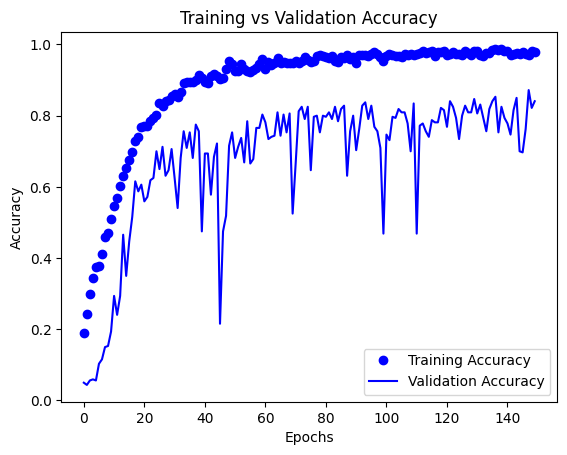

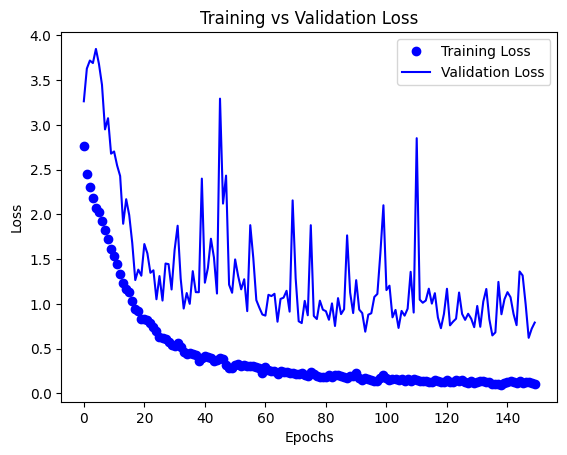

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy and loss per epoch.
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title(f'Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title(f'Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
val_loss, val_acc = model.evaluate(val_ds_scaled)
print(f'Validation Accuracy: {val_acc:.2f}')
print(f'Validation Loss: {val_loss:.2f}')

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.8362 - loss: 0.8225
Validation Accuracy: 0.84
Validation Loss: 0.79


I'm not very happy with those results:<br>
*   The **training accuracy** converges very close to **1**.
*   The **training loss** converges very close to **0**.
*   There is **high fluctuation** and a lot of **spikes** in the **validation** curves.
*   There is a significant **distance** between the **training** and the **validation** curves, which most importantly is **not stable**.<br>

These remarks suggest **overfitting**. The model does learn, but also overfits and possibly memorizing instead of generalizing to unseen data. This is not unexpected given the **small size of the input data**, and especially the input validation dataset, which is not even augmented.

On a good note, **validation accuracy** is **84%**, but I'm not sure how reliable that is with all that fluctuation.

Let's display a confusion matrix heatmap for the validation dataset and see how the model performs across the classes.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step



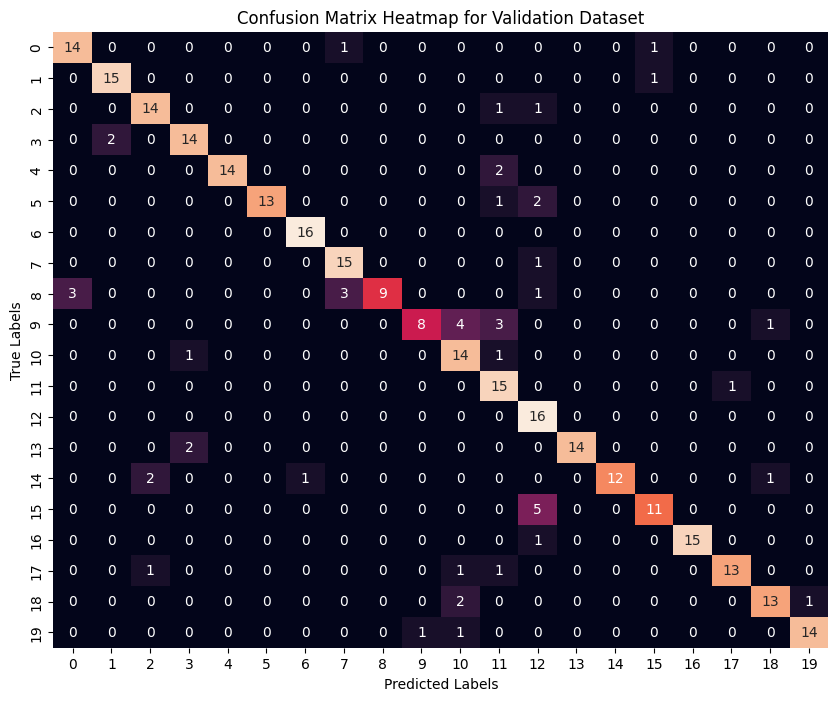

0: Alexandra Daddario
1: Anastasia
2: Andy Samberg
3: Billie Eilish
4: Brad Pitt
5: Camila Cabello
6: Christos
7: Claire Holt
8: Courtney Cox
9: Henry Cavill
10: Hrithik Roshan
11: Hugh Jackman
12: Jessica Alba
13: Kyriaki
14: Mitsos
15: Natalie Portman
16: Priyanka Chopra
17: Robert Downey Jr
18: Vijay Deverakonda
19: Zac Efron


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
from sklearn.metrics import confusion_matrix

# Get class names.
class_names = train_ds.class_names

# Get true labels and predicted labels for the validation dataset.
y_true = []
y_pred = []

# For all the images in the validation dataset...
for image, label in val_ds_scaled:
  pred = model.predict(image) # predict the label for the image
  y_true.extend(np.argmax(label.numpy(), axis=1))
  y_pred.extend(np.argmax(pred, axis=1))

# Compute the confusion matrix.
cm = confusion_matrix(y_true, y_pred)

print()
# Plot the confusion matrix.
plt.figure(figsize=(10, 8))
seaborn.heatmap(cm, annot=True, fmt="d", cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Validation Dataset')
plt.show()

# Show each index to which person it maps.
for index, name in enumerate(class_names):
  print(f'{index}: {name}')

All classes have a strong diagonal, meaning correct predictions for the most part. There are some mismatches, which are normal and expected due to facial similarities (like eye color, or facial hair for men). It seems that the model struggles to recognize Henry Cavill and mismatches him much with Hrithik Roshan and Hugh Jackman.

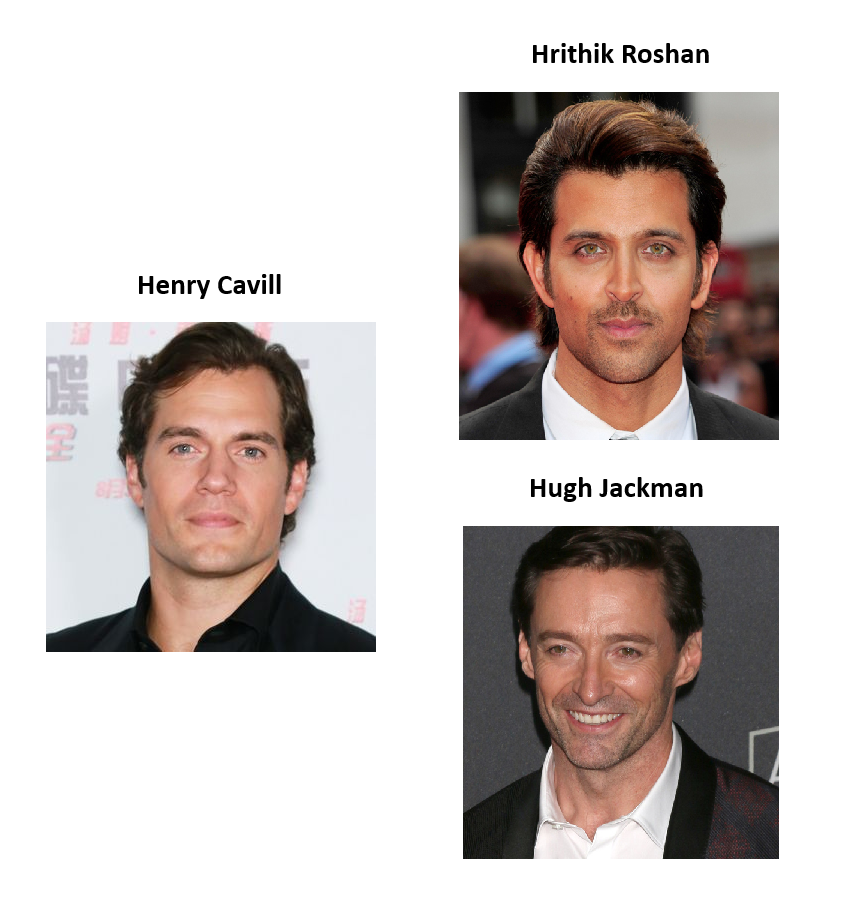

Let's now test our trained model on a separate dataset (test dataset). This dataset contains new images for our 20 people, different from the ones we used for training and validation. For the celebrities in the Kaggle dataset, I collected one additional photo per person from Google Images, ensuring they were different from the original Kaggle images, and for myself, my friends, and family, again I collected one additional photo per person.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Andy Samberg (1.00)


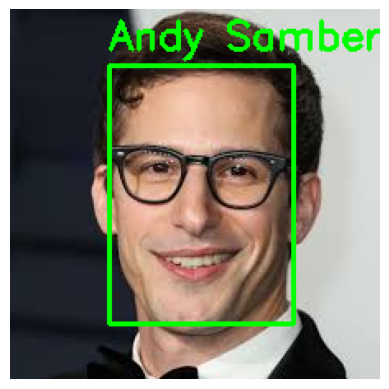

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Billie Eilish (0.72)


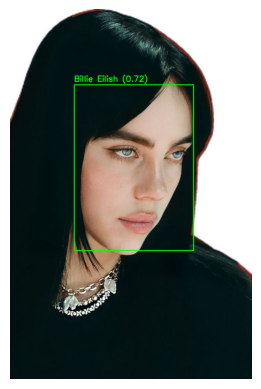

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Camila Cabello (0.98)


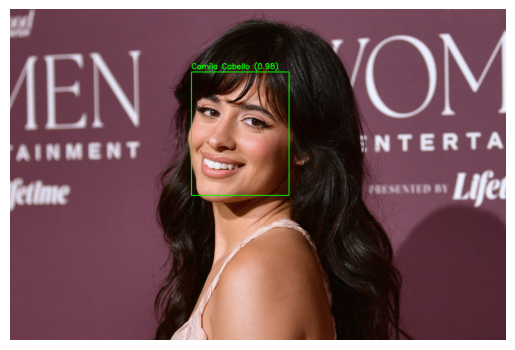

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Hugh Jackman (0.97)


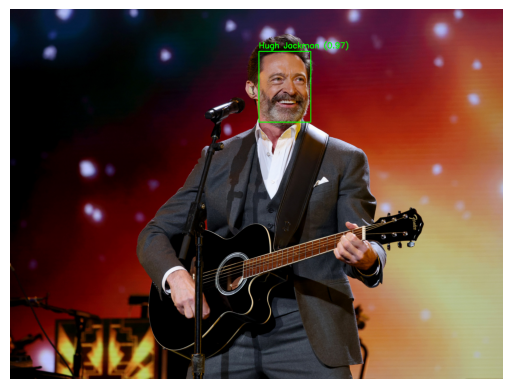

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Jessica Alba (1.00)


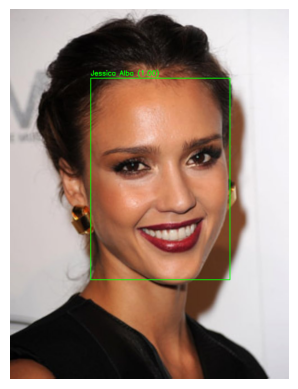

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Camila Cabello (0.76)


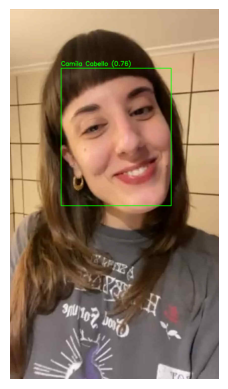

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Robert Downey Jr (0.96)


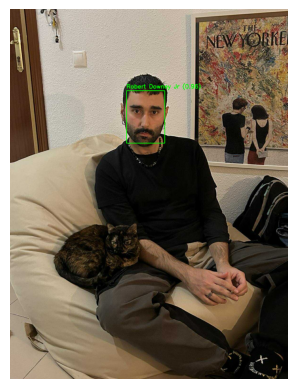

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Robert Downey Jr (0.99)


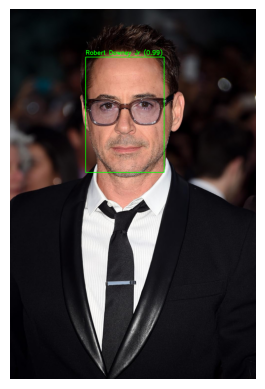

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Priyanka Chopra (0.99)


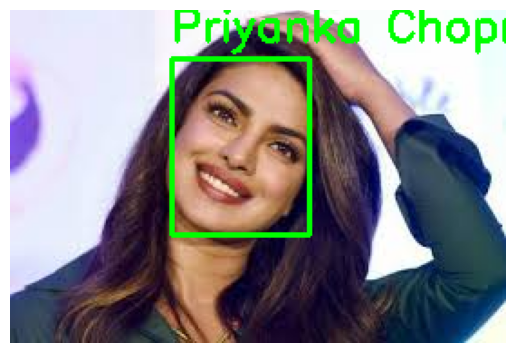

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Priyanka Chopra (1.00)


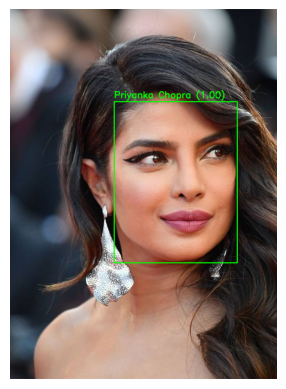

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Hrithik Roshan (0.77)


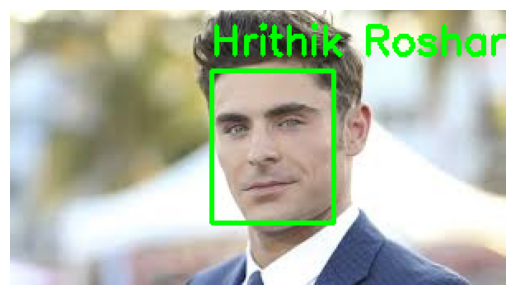

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Jessica Alba (0.96)


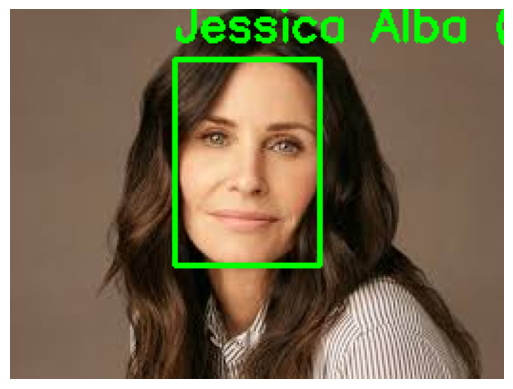

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Natalie Portman (0.99)


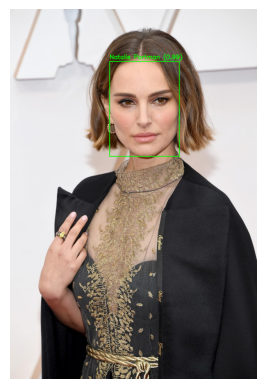

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Hugh Jackman (0.99)


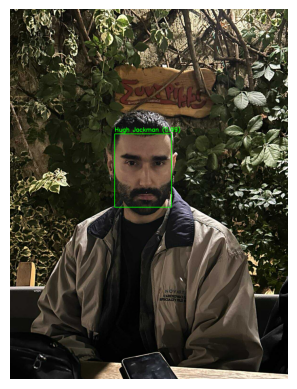

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Andy Samberg (0.71)


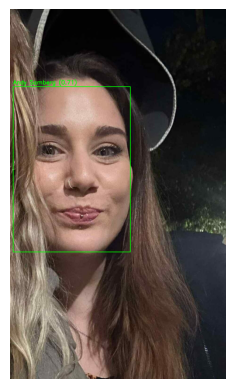

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Robert Downey Jr (0.70)


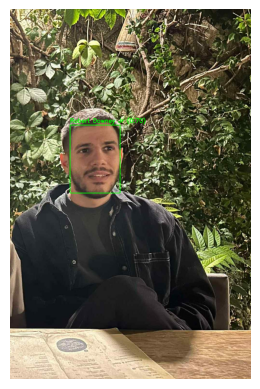

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Courtney Cox (0.79)


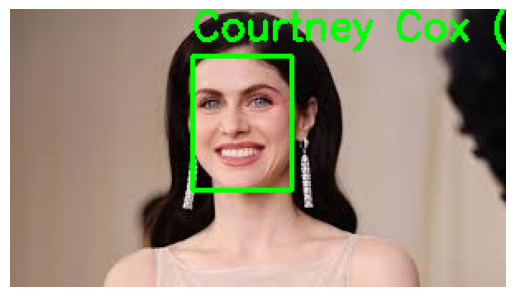

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Brad Pitt (0.83)


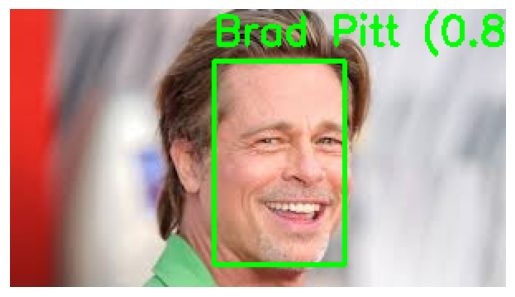

In [ ]:
from mtcnn import MTCNN
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load MTCNN face detector.
face_detector = MTCNN()

# Define the input image size for the model.
model_image_size = (224, 224)

# Get the folder with the test images.
test_dir = os.path.join(target_folder, 'test')

# Get people's names.
labels = train_ds.class_names

# For all test images.
for test_img in os.listdir(test_dir):
  # Take the image.
  image_path = os.path.join(test_dir, test_img)

  # Prepare image for MTCNN and OpenCV processing.
  img = cv2.imread(image_path)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Detect faces.
  faces = face_detector.detect_faces(img_rgb)

  # For every face in the image...
  for face in faces:
    # Get coordinates of the face.
    x, y, w, h = face['box']
    x, y = max(0, x), max(0, y) # make sure coords are non negative

    face_img = img_rgb[y:y+h, x:x+w] # Crop the face out of the image.

    # Prepare the face for the model.
    face_resized = cv2.resize(face_img, model_image_size)
    face_array = np.expand_dims(face_resized / 255.0, axis=0)

    # Make prediction.
    pred = model.predict(face_array) # this returns probabilities of matching for all the classes in the dataset
    max_prob = np.max(pred)
    max_prob_index = np.argmax(pred)

    label = f'{labels[max_prob_index]} ({max_prob:.2f})'
    print(label)

    # Draw box and annotation for the face.
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
    cv2.putText(img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

  # Display results.
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.axis('off')
  plt.show()

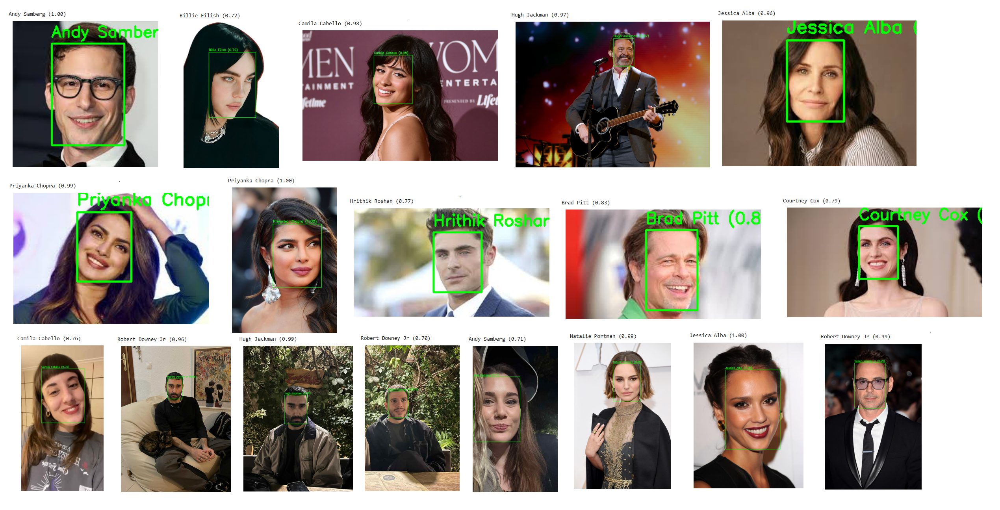

The model correctly classified 10/18 test images. This shows that it has learnt and can generalize to some extent beyond the training and validation data.<br>

Some of the incorrect predictions are somewhat understandable, as some people in the dataset share similar facial features.

However, a few mismatches don't really make sense, for example predicting Courtney Cox as Jessica Alba. This suggests that while the model has picked up on general facial structure and patterns, it still struggles to recognize some of the people in the dataset.

## B. **Use Transfer Learning**

I was not fully satisfied with the results from my previous model. With only 80 images per person, even though I used data augmentation, dropout layers, and L2 Regularization, I was concerned about overfitting and how well the model generalizes. Most importantly, the model's predictions were inconsistent, occasionally assigning incorrect labels to people, even though the mismatched person looked somewhat similar to the person behind the label. Looking for a more robust and reliable solution, I came across this article by Wei-Meng Lee <sup>[3]</sup> about how we can use **transfer learning** for face recognition, and I thought I should try it out and see if this would work better.

We will use **MobileNetV2**. MobileNetV2 is a pretrained Convolutional Neural Network that is designed for image classification tasks, is relatively lightweight, and combines speed, accuracy, and computational efficiency. We will use the pretrained model for feature extraction, add our own classifier, and train the model on our dataset. We will **fine-tune** the last 10% of the pretrained model layers, to improve validation accuracy.

In [ ]:
from tensorflow.keras.applications import MobileNetV2

# Load MobileNetV2.
pretrained_model = MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False, # we will add our own classifier
    weights='imagenet' # load pretrained weights
)

# We will try fine-tuning,
# to see if we can improve the accuracy
# further from 70-72%.

pretrained_model.trainable = False # Don't let the pretrained weights be updated during training (initially).

# Get the number of layers in the pretrained model.
layers = len(pretrained_model.layers)

# Define the percentage of the layers we want to unfreeze.
unfreeze_percentage = 0.1 # 10%

# Take the number of layers we will unfreeze.
unfreeze_layers = int(unfreeze_percentage * layers)

# Unfreeze the layers.
for layer in pretrained_model.layers[-unfreeze_layers:]:
  layer.trainable = True

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import models

# Build model.
model = models.Sequential()
model.add(pretrained_model)
model.add(layers.GlobalAveragePooling2D())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.3))
model.add(layers.Dense(20,activation='softmax')) # multiclass classification problem with 20 classes

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20)             │         5,140 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,591,060 (9.88 MB)

 Trainable params: 1,373,076 (5.24 MB)

 Non-trainable params: 1,217,984 (4.65 MB)

In [ ]:
from tensorflow.keras.optimizers import Adam

# Compile model.
model.compile(loss='categorical_crossentropy',
              optimizer=Adam(1e-5), # This is important! I tried 0.001 and 1e-4 and it didn't work well.
              metrics=['accuracy'])

In [ ]:
# Train model.
history = model.fit(
      train_ds_scaled_aug,
      epochs=200,
      validation_data=val_ds_scaled)

Epoch 1/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 606ms/step - accuracy: 0.0615 - loss: 3.2123 - val_accuracy: 0.0594 - val_loss: 3.1339
Epoch 2/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 517ms/step - accuracy: 0.0744 - loss: 3.0839 - val_accuracy: 0.0875 - val_loss: 3.0603
Epoch 3/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 516ms/step - accuracy: 0.1121 - loss: 2.9866 - val_accuracy: 0.0938 - val_loss: 2.9893
Epoch 4/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 517ms/step - accuracy: 0.1247 - loss: 2.8729 - val_accuracy: 0.1000 - val_loss: 2.9256
Epoch 5/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 518ms/step - accuracy: 0.1604 - loss: 2.7650 - val_accuracy: 0.1031 - val_loss: 2.8665
Epoch 6/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 515ms/step - accuracy: 0.1709 - loss: 2.7385 - val_accuracy: 0.1219 - val_loss: 2.8118
Epoch 7/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 515ms/step - accuracy: 0.2212 - loss: 2.6398 - val_accuracy: 0.1531 - val_loss: 2.7515
Epoch 8/200
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 516ms/step - accuracy: 0.2314 - loss: 2.5538 - 

In [ ]:
# Save model after training.
model.save('/content/drive/MyDrive/CSCI S-89 Deep Learning/FinalProject/MobileNetV2_model.keras')

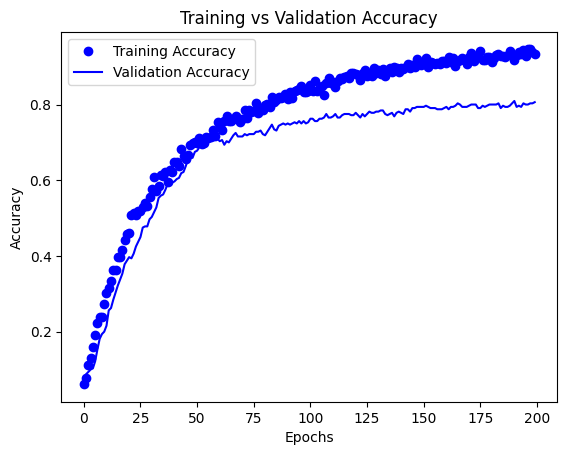

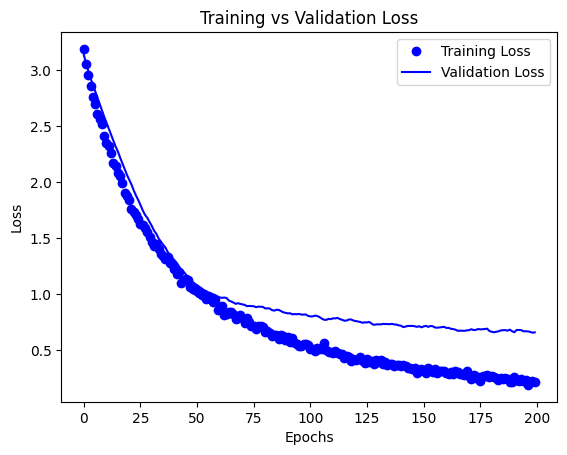

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy and loss per epoch.
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title(f'Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title(f'Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
val_loss, val_acc = model.evaluate(val_ds_scaled)
print(f'Validation Accuracy: {val_acc:.2f}')
print(f'Validation Loss: {val_loss:.2f}')

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.7697 - loss: 0.8104
Validation Accuracy: 0.81
Validation Loss: 0.66


I'm very pleased with the performance of this model. Both the training and the validation curves are smooth, steadily improving, and remain adequately close to each other. We reach a **validation accuracy** of **81%**, which is great. The model appears to **generalize well** and there are **no signs of overfitting**.<br><br>
To sum up, these are the tools, practices, and techniques we used for these results:<br>
*   **MobileNetV2** as a pretrained backbone for feature extraction,
*   **Fine-tuning** for **the last 10% of the layers** of the pretrained model (without this the validation accuracy would plateau at around 70-72%),
*   Custom classifier with **256 neurons** and a **Dropout layer** of rate 0.3,
*   **Adam** optimizer with **learning rate 1e-5** (0.001 or 1e-4 would not work well),
*   **200 epochs** (to allow the model to converge).

Let's now display a confusion matrix heatmap for the validation dataset and see how the model performs across all classes.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step



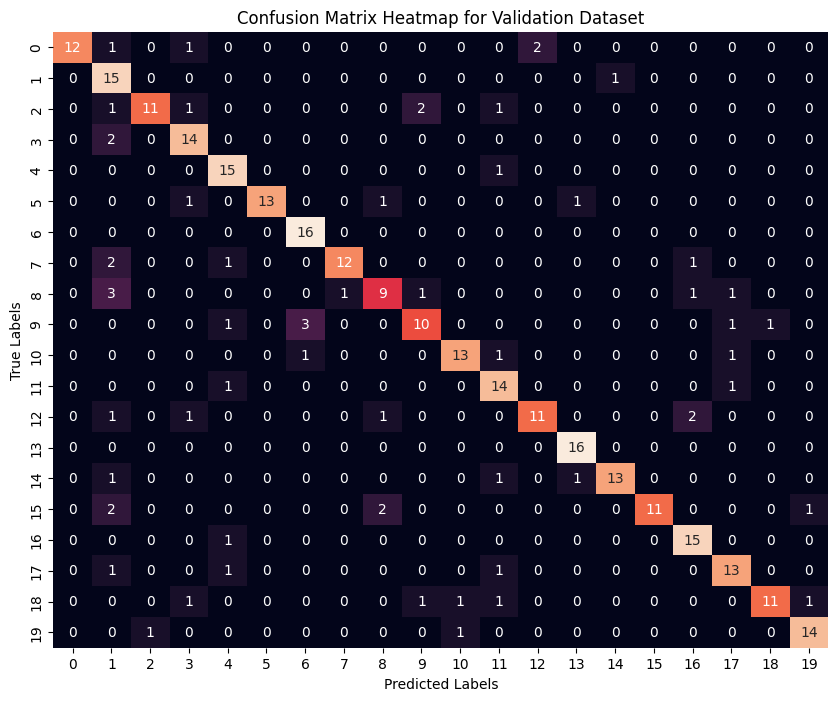

0: Alexandra Daddario
1: Anastasia
2: Andy Samberg
3: Billie Eilish
4: Brad Pitt
5: Camila Cabello
6: Christos
7: Claire Holt
8: Courtney Cox
9: Henry Cavill
10: Hrithik Roshan
11: Hugh Jackman
12: Jessica Alba
13: Kyriaki
14: Mitsos
15: Natalie Portman
16: Priyanka Chopra
17: Robert Downey Jr
18: Vijay Deverakonda
19: Zac Efron


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
from sklearn.metrics import confusion_matrix

# Get class names.
class_names = train_ds.class_names

# Get true labels and predicted labels for the validation dataset.
y_true = []
y_pred = []

# For all the images in the validation dataset...
for image, label in val_ds_scaled:
  pred = model.predict(image) # predict the label for the image
  y_true.extend(np.argmax(label.numpy(), axis=1))
  y_pred.extend(np.argmax(pred, axis=1))

# Compute the confusion matrix.
cm = confusion_matrix(y_true, y_pred)

print()
# Plot the confusion matrix.
plt.figure(figsize=(10, 8))
seaborn.heatmap(cm, annot=True, fmt="d", cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Validation Dataset')
plt.show()

# Show each index to which person it maps.
for index, name in enumerate(class_names):
  print(f'{index}: {name}')

For the most part, most predictions are aligned along the diagonal. There are some mismatches, but only a few, and between people that have similar facial features and structure, like Brad Pitt and Robert Downey Jr.

Let's now test our trained model on a separate dataset (test dataset). This dataset contains new images for our 20 people, different from the ones we used for training and validation. For the celebrities in the Kaggle dataset, I collected one additional photo per person from Google Images, ensuring they were different from the original Kaggle images, and for myself, my friends, and family, again I collected one additional photo per person.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Andy Samberg (0.82)


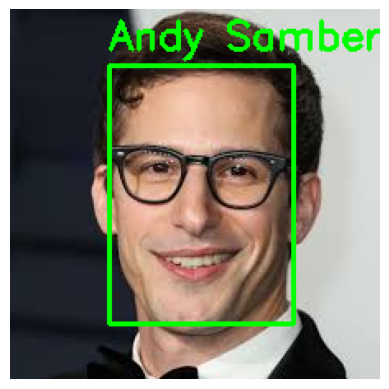

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Billie Eilish (0.96)


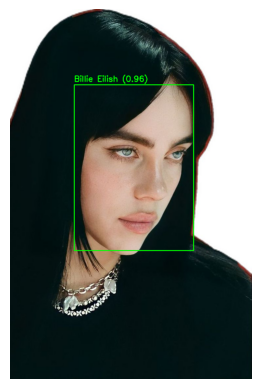

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Camila Cabello (1.00)


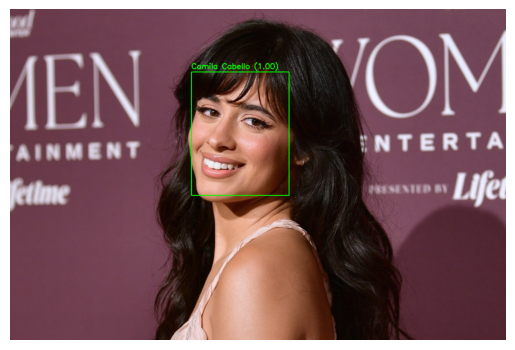

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Hugh Jackman (0.98)


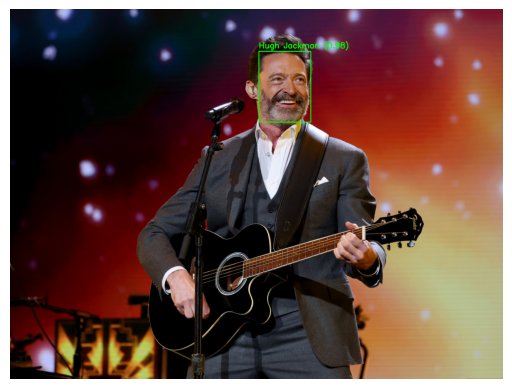

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Jessica Alba (0.97)


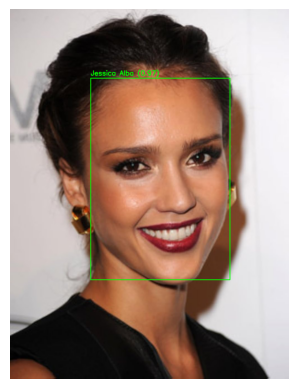

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Kyriaki (0.96)


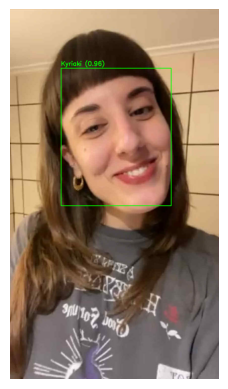

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Mitsos (0.35)


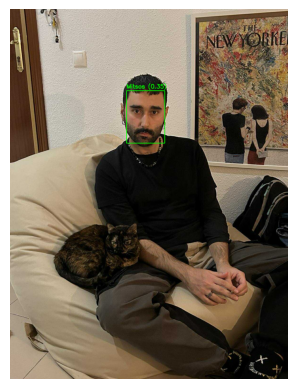

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Robert Downey Jr (0.97)


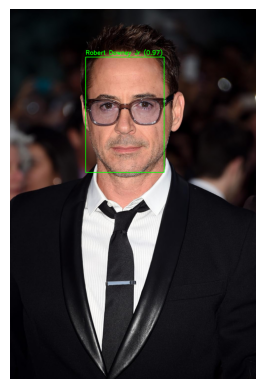

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Priyanka Chopra (0.99)


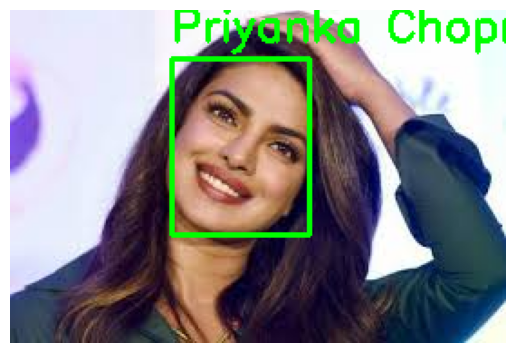

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Priyanka Chopra (0.91)


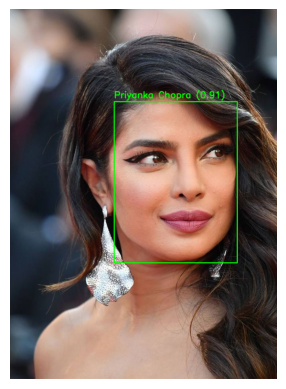

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Zac Efron (0.88)


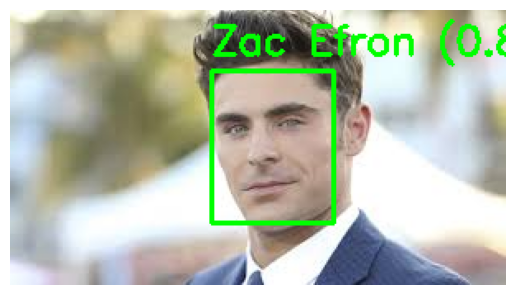

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Courtney Cox (1.00)


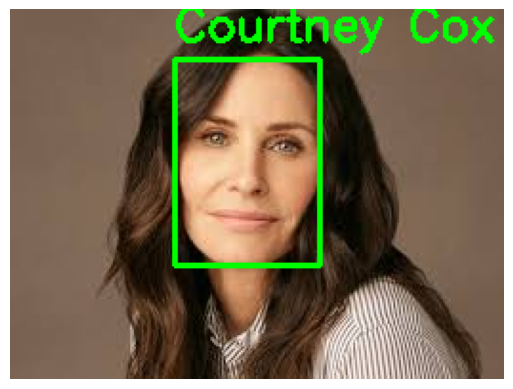

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Natalie Portman (0.94)


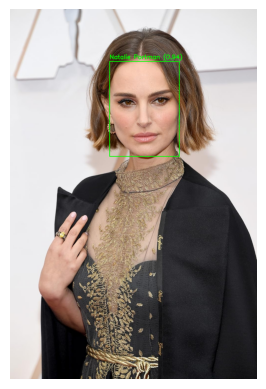

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Mitsos (0.55)


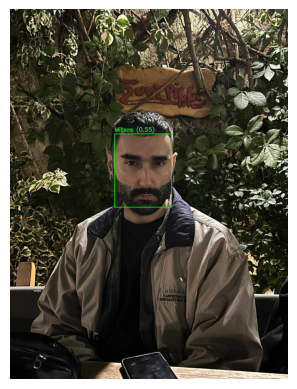

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Christos (0.87)


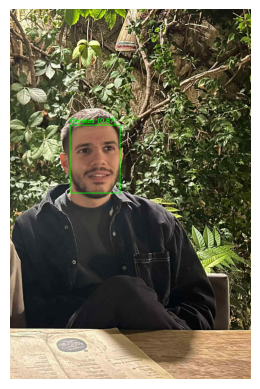

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Anastasia (0.93)


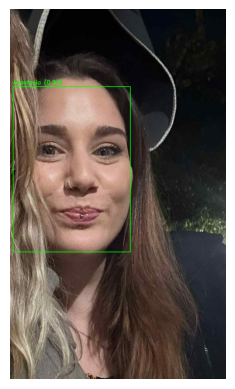

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Alexandra Daddario (0.68)


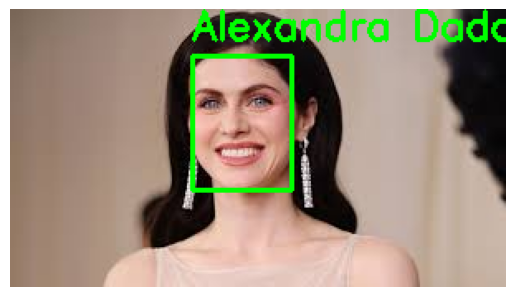

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Brad Pitt (0.96)


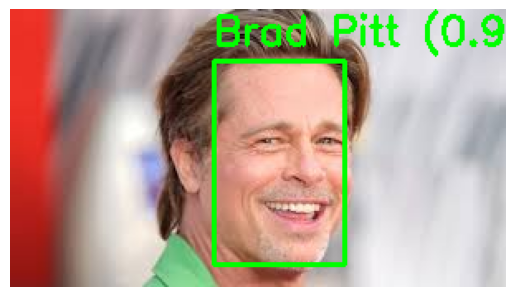

In [ ]:
from mtcnn import MTCNN
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load MTCNN face detector.
face_detector = MTCNN()

# Define the input image size for the model.
model_image_size = (224, 224)

# Get the folder with the test images.
test_dir = os.path.join(target_folder, 'test')

# Get people's names.
labels = train_ds.class_names

# For all test images.
for test_img in os.listdir(test_dir):
  # Take the image.
  image_path = os.path.join(test_dir, test_img)

  # Prepare image for MTCNN and OpenCV processing.
  img = cv2.imread(image_path)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Detect faces.
  faces = face_detector.detect_faces(img_rgb)

  # For every face in the image...
  for face in faces:
    # Get coordinates of the face.
    x, y, w, h = face['box']
    x, y = max(0, x), max(0, y) # make sure coords are non negative

    face_img = img_rgb[y:y+h, x:x+w] # Crop the face out of the image.

    # Prepare the face for the model.
    face_resized = cv2.resize(face_img, model_image_size)
    face_array = np.expand_dims(face_resized / 255.0, axis=0)

    # Make prediction.
    pred = model.predict(face_array) # this returns probabilities of matching for all the classes in the dataset
    max_prob = np.max(pred)
    max_prob_index = np.argmax(pred)

    label = f'{labels[max_prob_index]} ({max_prob:.2f})'
    print(label)

    # Draw box and annotation for the face.
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
    cv2.putText(img, label, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

  # Display results.
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.axis('off')
  plt.show()

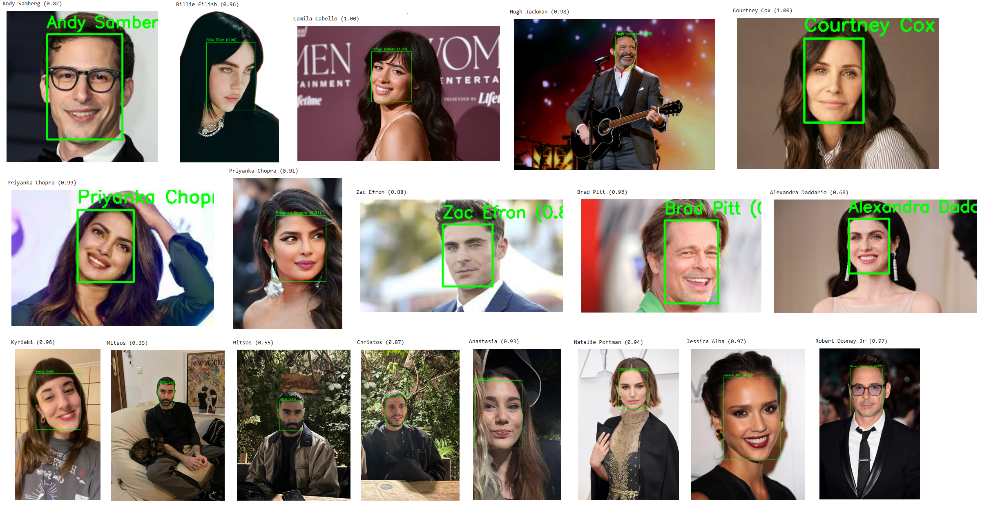

The model successfully recognizes all faces in the test dataset.

# Resources

[1]   Jawabreh, Ahmad. "Explore the most advanced deep learning algorithm for face detection". Medium, 1 Apr. 2023, https://medium.com/the-modern-scientist/multi-task-cascaded-convolutional-neural-network-mtcnn-a31d88f501c8.<br><br>
[2]   Tensorflow. "Image classification". Tensorflow, https://www.tensorflow.org/tutorials/images/classification.<br><br>
[3]   Lee, Wei-Meng. "Implementing Face Recognition Using Deep Learning and Support Vector Machines". CODE Magazine, May/June 2022, https://www.codemag.com/Article/2205081/Implementing-Face-Recognition-Using-Deep-Learning-and-Support-Vector-Machines.<br><br>
[4]   Tsang, Sik-Ho. "Review: MobileNetV2 - Light Weight Model (Image Classification)". Medium, 19 May 2019, https://medium.com/data-science/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c.<br><br>
[5]   Behairy, Ahmed. "Face Detection and Recognition". Kaggle, 16 Sep. 2024, https://www.kaggle.com/code/ahmedbehairyy/face-detection-and-recognition<br><br>
[6]   Görkem Çelebiler, Kerim. "Face Recognition with CNN". Kaggle, 26 Jun. 2021, https://www.kaggle.com/code/kerimelebiler/face-recognition-with-cnn/notebook<br><br>

Also Assignment 3 of the CSCI S-89 Introduction to Deep Learning course at Harvard Summer School really helped me in the implementation of this project.